In [1]:
import os

import matplotlib.pyplot as plt
from xcube.core.store import new_data_store
import xarray as xr
import numpy as np

xr.set_options(display_expand_attrs=False)

In [2]:
# greate s3 data store
s3_store = new_data_store(
    "s3",
    root=os.environ["S3_USER_STORAGE_BUCKET"],
    max_depth=10,
    storage_options=dict(
        anon=False,
        key=os.environ["S3_USER_STORAGE_KEY"],
        secret=os.environ["S3_USER_STORAGE_SECRET"],
    ),
)

---
## Cube 11

In [7]:
s3_store.delete_data("cubes/temp/science/0.1.0/064_2021.zarr")

FileNotFoundError: ['hub-deepesdl37/cubes/temp/science/0.1.0/064_2021.zarr']

In [18]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/034_2017.zarr")
for key in list(ds.keys()):
    array = ds[key].values.ravel()
    null_size = array[np.isnan(array)].size
    perc = (null_size / array.size) * 100
    print(f"Data variable {key} has {perc:.3f}% nan values.")

Data variable B01 has 4.128% nan values.
Data variable B02 has 4.128% nan values.
Data variable B03 has 4.128% nan values.
Data variable B04 has 4.128% nan values.
Data variable B05 has 4.128% nan values.
Data variable B06 has 4.128% nan values.
Data variable B07 has 4.128% nan values.
Data variable B08 has 3.972% nan values.
Data variable B09 has 4.466% nan values.
Data variable B11 has 4.466% nan values.
Data variable B12 has 4.466% nan values.
Data variable B8A has 4.128% nan values.
Data variable SCL has 0.000% nan values.
Data variable solar_angle has 0.000% nan values.
Data variable viewing_angle has 7.196% nan values.


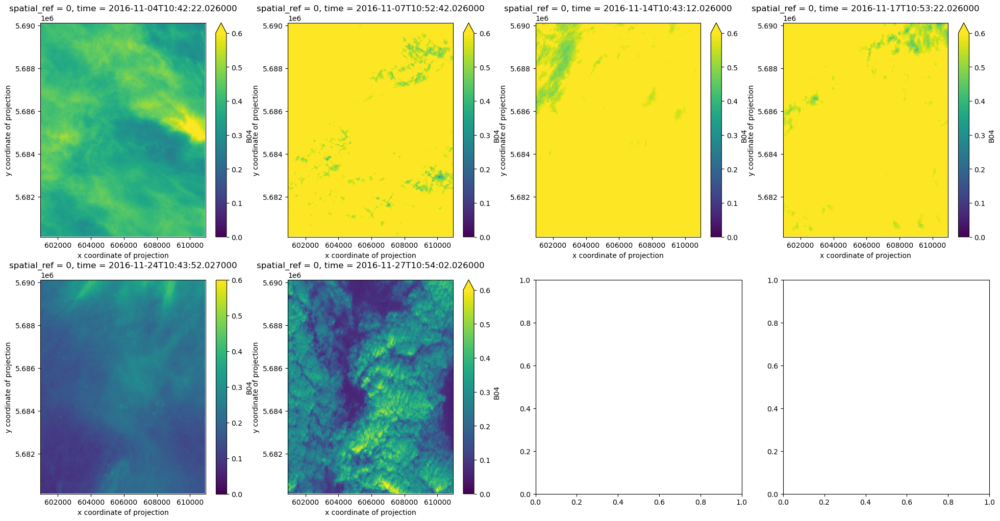

In [6]:
fig, _ax = plt.subplots(2, 4, figsize=(6*4, 6*2))
ax = _ax.flatten()
for i in range(6):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

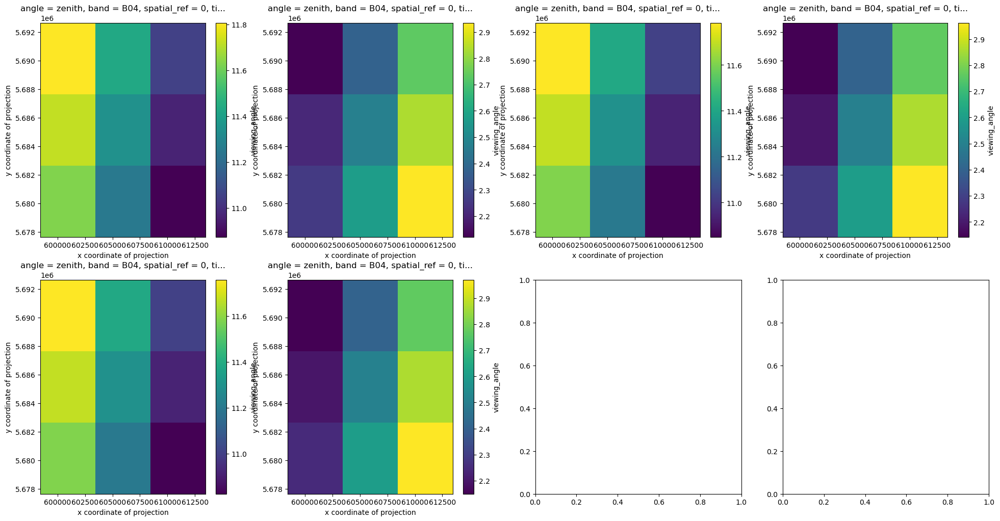

In [7]:
fig, _ax = plt.subplots(2, 4, figsize=(6*4, 6*2))
ax = _ax.flatten()
for i in range(6):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

---
## Cube 52

In [3]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/052_2017.zarr")
ds

<xarray.Dataset> Size: 7GB
Dimensions:        (time: 140, y: 1000, x: 1000, angle: 2, angle_x: 2,
                    angle_y: 2, band: 12)
Coordinates:
  * angle          (angle) <U7 56B 'Zenith' 'Azimuth'
  * angle_x        (angle_x) float64 16B 3.851e+05 3.901e+05
  * angle_y        (angle_y) float64 16B 5.604e+06 5.599e+06
  * band           (band) <U5 240B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2016-11-05T10:12:12.026000 ... 2...
  * x              (x) float64 8kB 3.851e+05 3.851e+05 ... 3.951e+05 3.951e+05
  * y              (y) float64 8kB 5.609e+06 5.609e+06 ... 5.599e+06 5.599e+06
Data variables: (12/15)
    B01            (time, y, x) float32 560MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B02            (time, y, x) float32 560MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B03            (time, y, x) float32 560MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B04            (time, y, x) float32 560MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B05            (time, y, x) float32 560MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B06            (time, y, x) float32 560MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 560MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B12            (time, y, x) float32 560MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B8A            (time, y, x) float32 560MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    SCL            (time, y, x) uint8 140MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    solar_angle    (time, angle, angle_y, angle_x) float32 4kB dask.array<chunksize=(1, 2, 2, 2), meta=np.ndarray>
    viewing_angle  (time, angle, band, angle_y, angle_x) float32 54kB dask.array<chunksize=(1, 2, 12, 2, 2), meta=np.ndarray>
Attributes: (2)

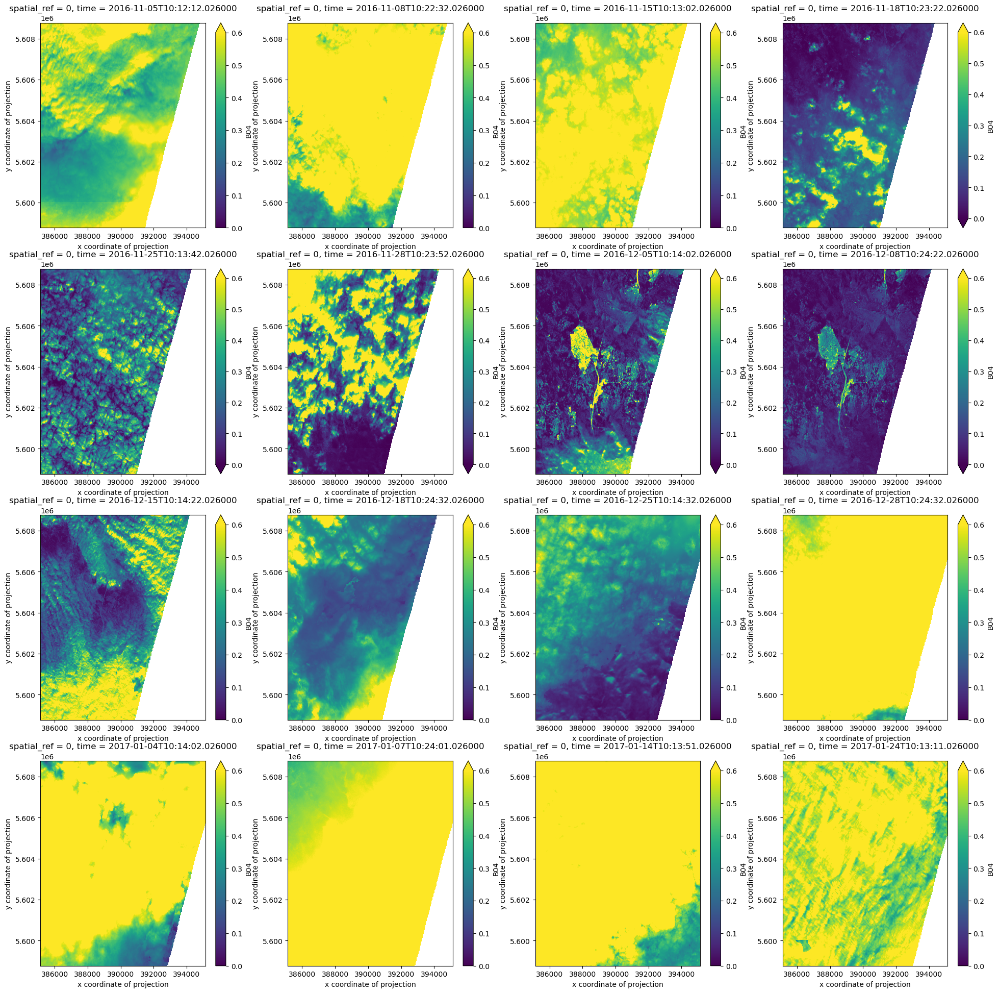

In [4]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

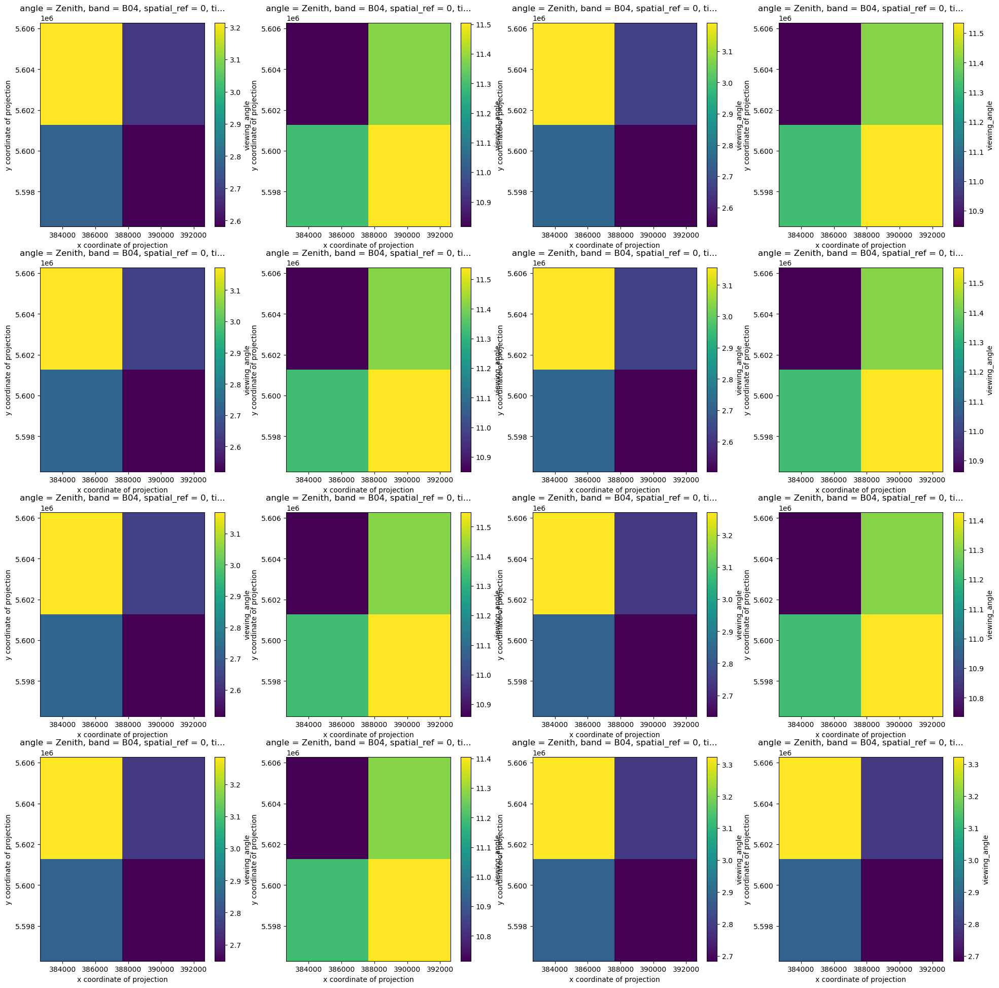

In [5]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

In [6]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/052_2018.zarr")
ds

<xarray.Dataset> Size: 7GB
Dimensions:        (time: 143, y: 1000, x: 1000, angle: 2, angle_x: 2,
                    angle_y: 2, band: 12)
Coordinates:
  * angle          (angle) <U7 56B 'Zenith' 'Azimuth'
  * angle_x        (angle_x) float64 16B 3.851e+05 3.901e+05
  * angle_y        (angle_y) float64 16B 5.604e+06 5.599e+06
  * band           (band) <U5 240B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2018-01-02T10:24:21.026000 ... 2...
  * x              (x) float64 8kB 3.851e+05 3.851e+05 ... 3.951e+05 3.951e+05
  * y              (y) float64 8kB 5.609e+06 5.609e+06 ... 5.599e+06 5.599e+06
Data variables: (12/15)
    B01            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B02            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B03            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B04            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B05            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B06            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B12            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B8A            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    SCL            (time, y, x) uint8 143MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    solar_angle    (time, angle, angle_y, angle_x) float32 5kB dask.array<chunksize=(1, 2, 2, 2), meta=np.ndarray>
    viewing_angle  (time, angle, band, angle_y, angle_x) float32 55kB dask.array<chunksize=(1, 2, 12, 2, 2), meta=np.ndarray>
Attributes: (2)

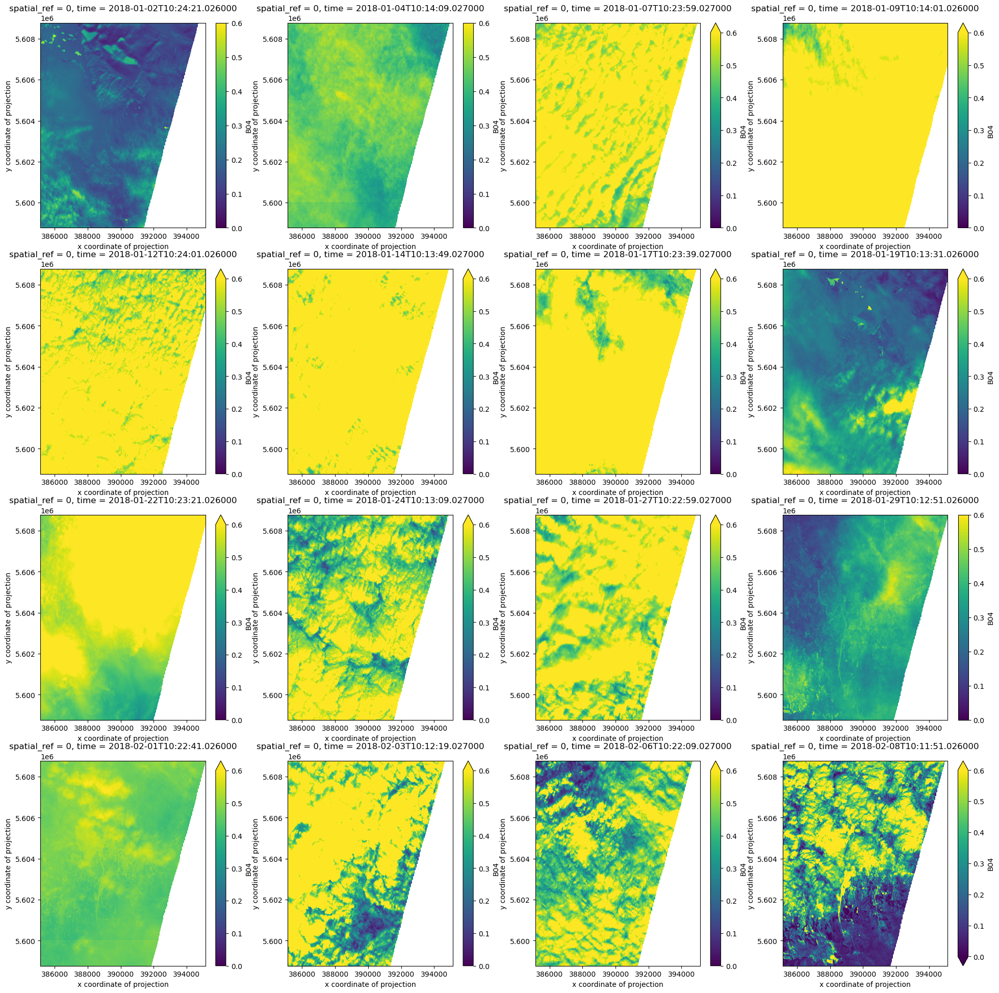

In [7]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

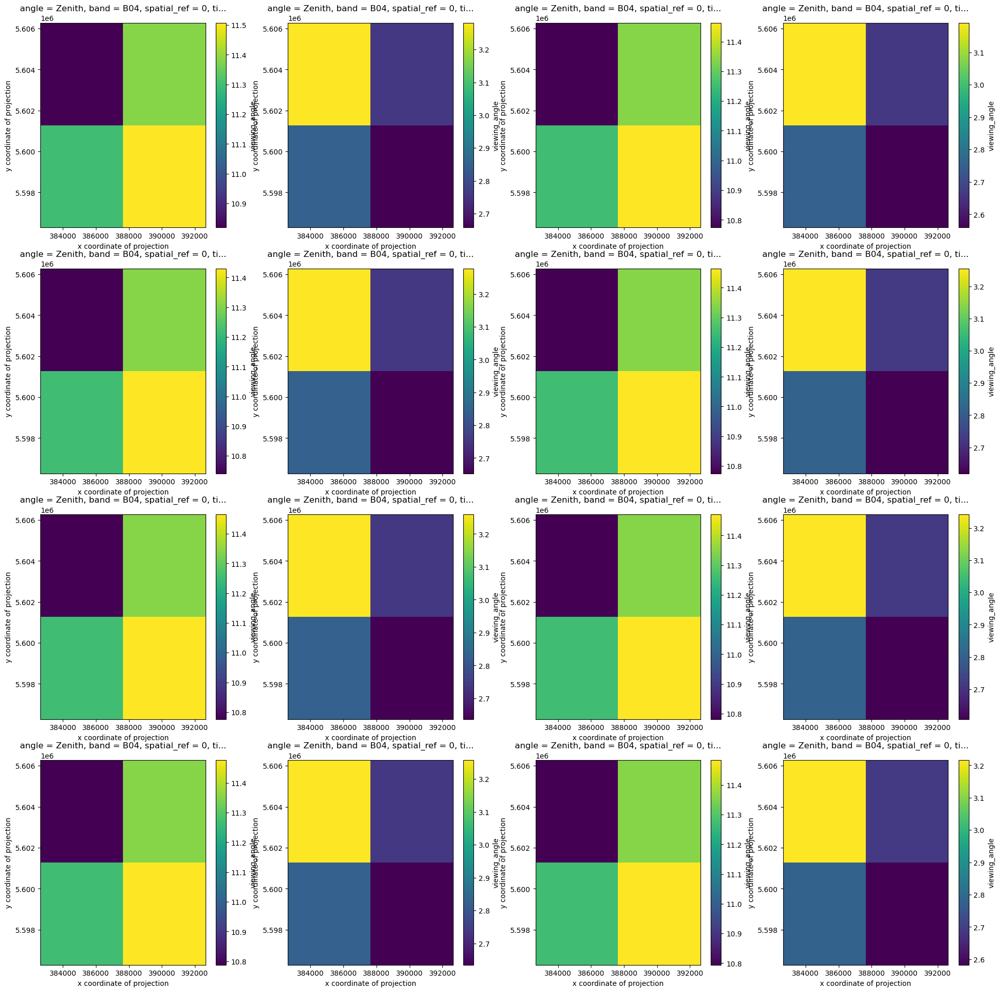

In [8]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

In [9]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/052_2022.zarr")
ds

<xarray.Dataset> Size: 7GB
Dimensions:        (time: 144, y: 1000, x: 1000, angle: 2, angle_x: 2,
                    angle_y: 2, band: 12)
Coordinates:
  * angle          (angle) <U7 56B 'Zenith' 'Azimuth'
  * angle_x        (angle_x) float64 16B 3.851e+05 3.901e+05
  * angle_y        (angle_y) float64 16B 5.604e+06 5.599e+06
  * band           (band) <U5 240B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2022-01-01T10:24:31.024000 ... 2...
  * x              (x) float64 8kB 3.851e+05 3.851e+05 ... 3.951e+05 3.951e+05
  * y              (y) float64 8kB 5.609e+06 5.609e+06 ... 5.599e+06 5.599e+06
Data variables: (12/15)
    B01            (time, y, x) float32 576MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B02            (time, y, x) float32 576MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B03            (time, y, x) float32 576MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B04            (time, y, x) float32 576MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B05            (time, y, x) float32 576MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B06            (time, y, x) float32 576MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 576MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B12            (time, y, x) float32 576MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B8A            (time, y, x) float32 576MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    SCL            (time, y, x) uint8 144MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    solar_angle    (time, angle, angle_y, angle_x) float32 5kB dask.array<chunksize=(1, 2, 2, 2), meta=np.ndarray>
    viewing_angle  (time, angle, band, angle_y, angle_x) float32 55kB dask.array<chunksize=(1, 2, 12, 2, 2), meta=np.ndarray>
Attributes: (2)

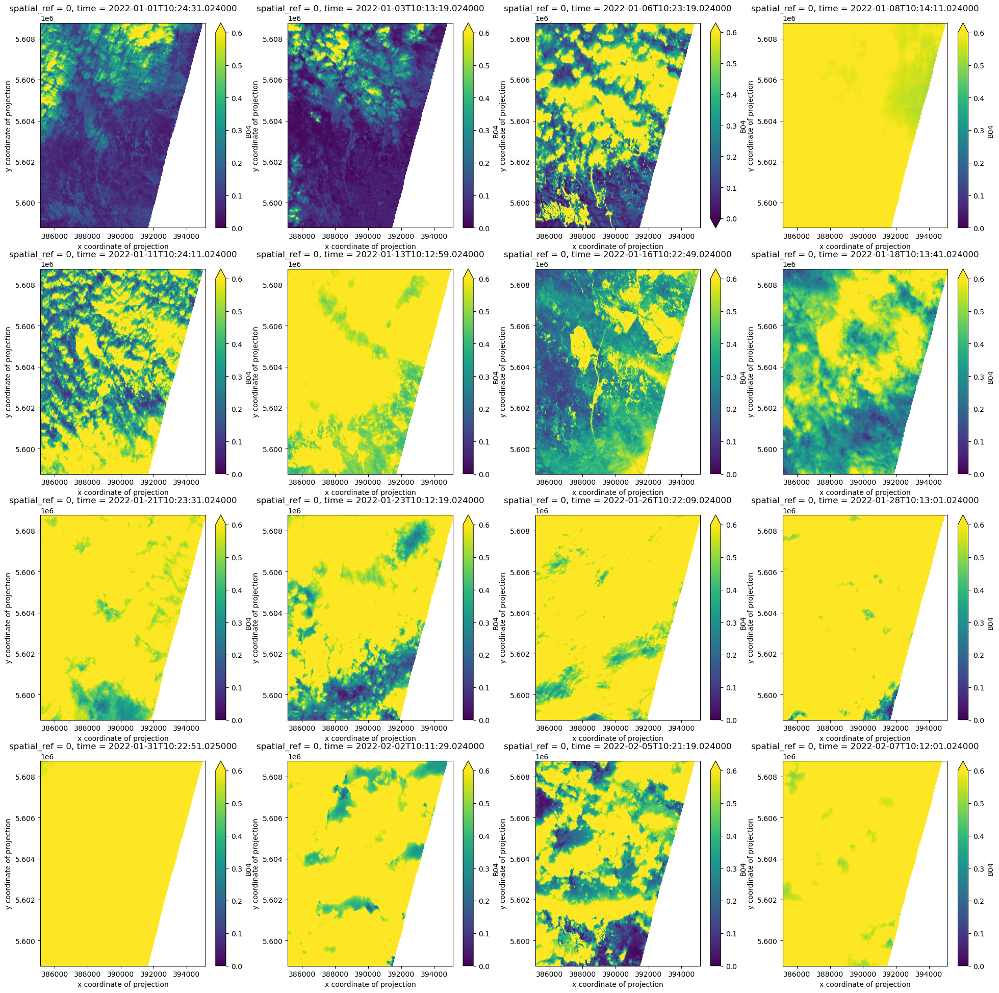

In [10]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

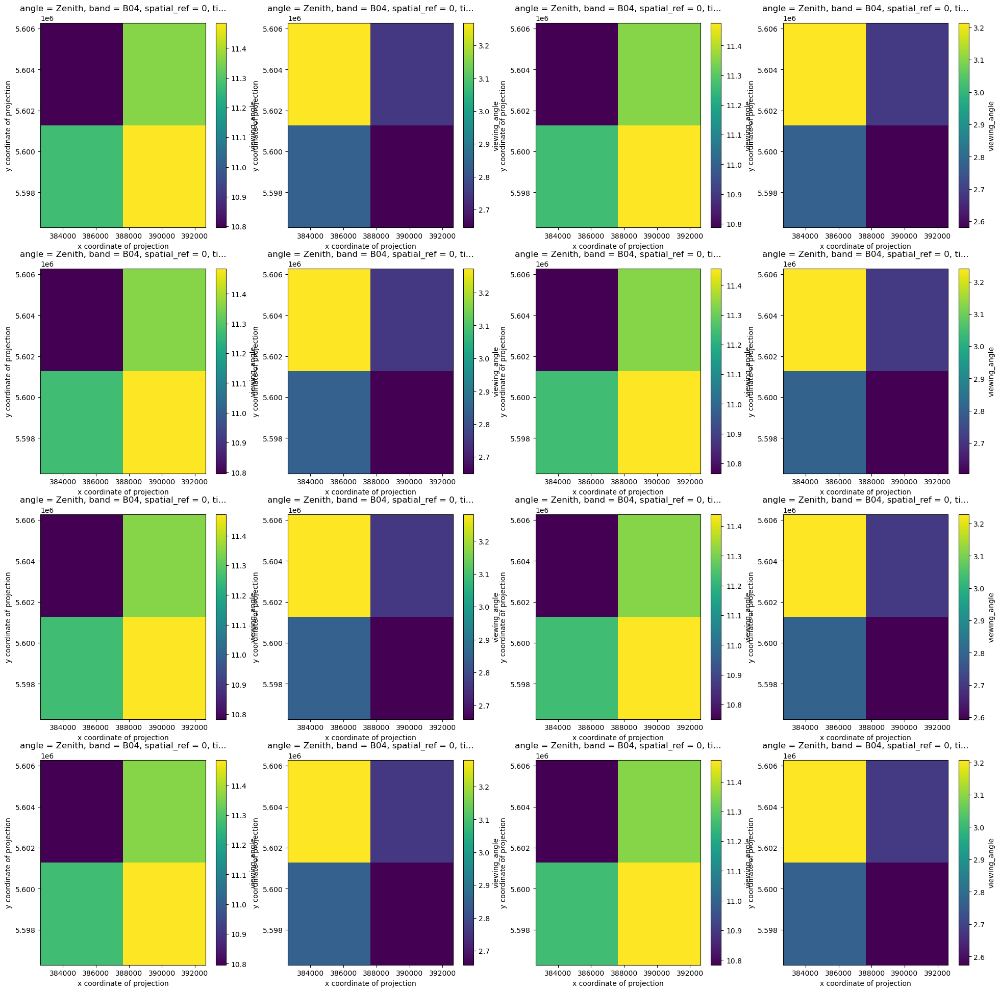

In [11]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

In [3]:
data_id = "collections/sentinel-2-l2a/items/S2C_MSIL2A_20250512T100611_N0511_R022_T33UUS_20250512T173114"
credentials = {
    "key": "O0M0CUQIDQO9TDZ4D8NR",
    "secret": "qPUyXs9G6j8on6MY5KPhQNHuA5uZTqxEscrbBCGx",
}

stac_store = new_data_store("stac-cdse", stack_mode=False, **credentials)
ds = stac_store.open_data(
    data_id,
    asset_names=["B04", "B03", "B02", "SCL"],
    apply_scaling=True
)
ds

<xarray.Dataset> Size: 2GB
Dimensions:      (x: 10980, y: 10980)
Coordinates:
  * x            (x) float64 88kB 3e+05 3e+05 3e+05 ... 4.098e+05 4.098e+05
  * y            (y) float64 88kB 5.7e+06 5.7e+06 5.7e+06 ... 5.59e+06 5.59e+06
    spatial_ref  int64 8B 0
Data variables:
    B04          (y, x) float32 482MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    B03          (y, x) float32 482MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    B02          (y, x) float32 482MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    SCL          (y, x) uint8 121MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
Attributes: (2)

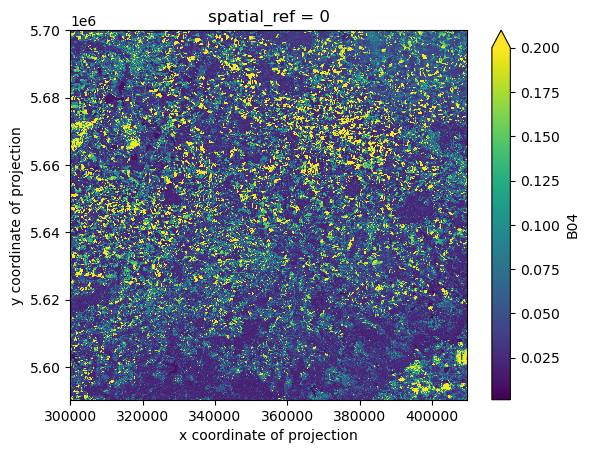

In [5]:
ds.B04[::10, ::10].plot(vmax=0.2)

---
## Cube 64

In [12]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/064_2017.zarr")
ds

<xarray.Dataset> Size: 7GB
Dimensions:        (time: 127, y: 1000, x: 1000, angle: 2, angle_x: 2,
                    angle_y: 2, band: 12)
Coordinates:
  * angle          (angle) <U7 56B 'Zenith' 'Azimuth'
  * angle_x        (angle_x) float64 16B 4.439e+05 4.489e+05
  * angle_y        (angle_y) float64 16B 5.38e+06 5.375e+06
  * band           (band) <U5 240B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2016-11-01T10:32:02.026000 ... 2...
  * x              (x) float64 8kB 4.439e+05 4.439e+05 ... 4.539e+05 4.539e+05
  * y              (y) float64 8kB 5.385e+06 5.385e+06 ... 5.375e+06 5.375e+06
Data variables: (12/15)
    B01            (time, y, x) float32 508MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B02            (time, y, x) float32 508MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B03            (time, y, x) float32 508MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B04            (time, y, x) float32 508MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B05            (time, y, x) float32 508MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B06            (time, y, x) float32 508MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 508MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B12            (time, y, x) float32 508MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B8A            (time, y, x) float32 508MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    SCL            (time, y, x) float64 1GB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    solar_angle    (time, angle, angle_y, angle_x) float32 4kB dask.array<chunksize=(1, 2, 2, 2), meta=np.ndarray>
    viewing_angle  (time, angle, band, angle_y, angle_x) float32 49kB dask.array<chunksize=(1, 2, 12, 2, 2), meta=np.ndarray>
Attributes: (13)

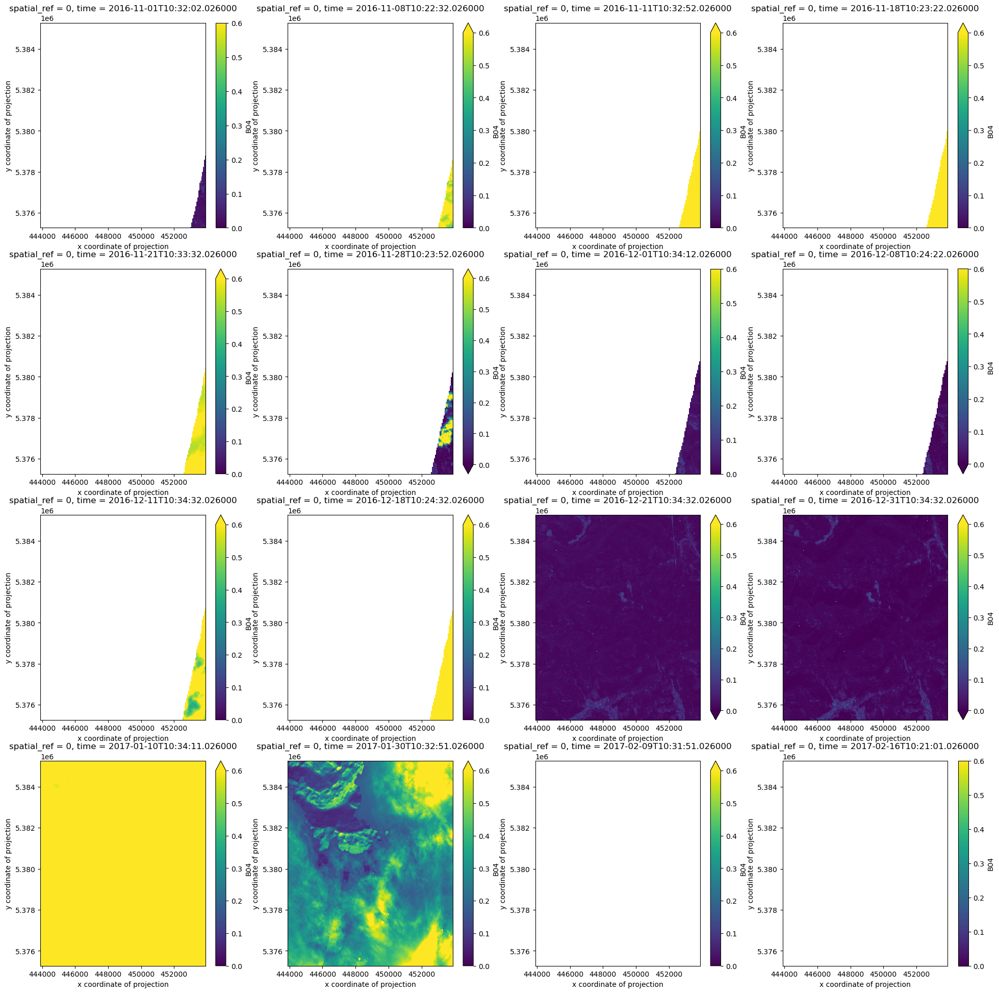

In [13]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

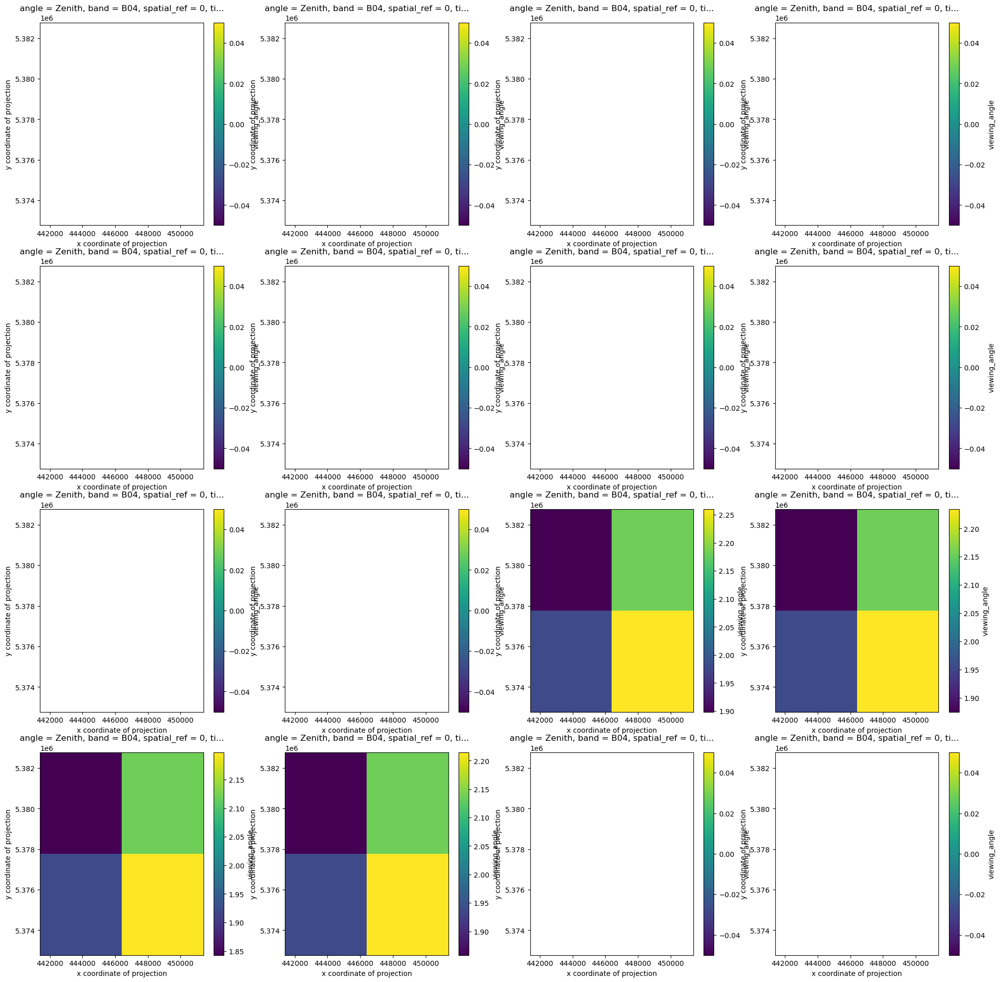

In [14]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

In [15]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/064_2018.zarr")
ds

<xarray.Dataset> Size: 8GB
Dimensions:        (time: 141, y: 1000, x: 1000, angle: 2, angle_x: 2,
                    angle_y: 2, band: 12)
Coordinates:
  * angle          (angle) <U7 56B 'Zenith' 'Azimuth'
  * angle_x        (angle_x) float64 16B 4.439e+05 4.489e+05
  * angle_y        (angle_y) float64 16B 5.38e+06 5.375e+06
  * band           (band) <U5 240B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2018-01-02T10:24:21.026000 ... 2...
  * x              (x) float64 8kB 4.439e+05 4.439e+05 ... 4.539e+05 4.539e+05
  * y              (y) float64 8kB 5.385e+06 5.385e+06 ... 5.375e+06 5.375e+06
Data variables: (12/15)
    B01            (time, y, x) float32 564MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B02            (time, y, x) float32 564MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B03            (time, y, x) float32 564MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B04            (time, y, x) float32 564MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B05            (time, y, x) float32 564MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B06            (time, y, x) float32 564MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 564MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B12            (time, y, x) float32 564MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B8A            (time, y, x) float32 564MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    SCL            (time, y, x) float64 1GB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    solar_angle    (time, angle, angle_y, angle_x) float32 5kB dask.array<chunksize=(1, 2, 2, 2), meta=np.ndarray>
    viewing_angle  (time, angle, band, angle_y, angle_x) float32 54kB dask.array<chunksize=(1, 2, 12, 2, 2), meta=np.ndarray>
Attributes: (13)

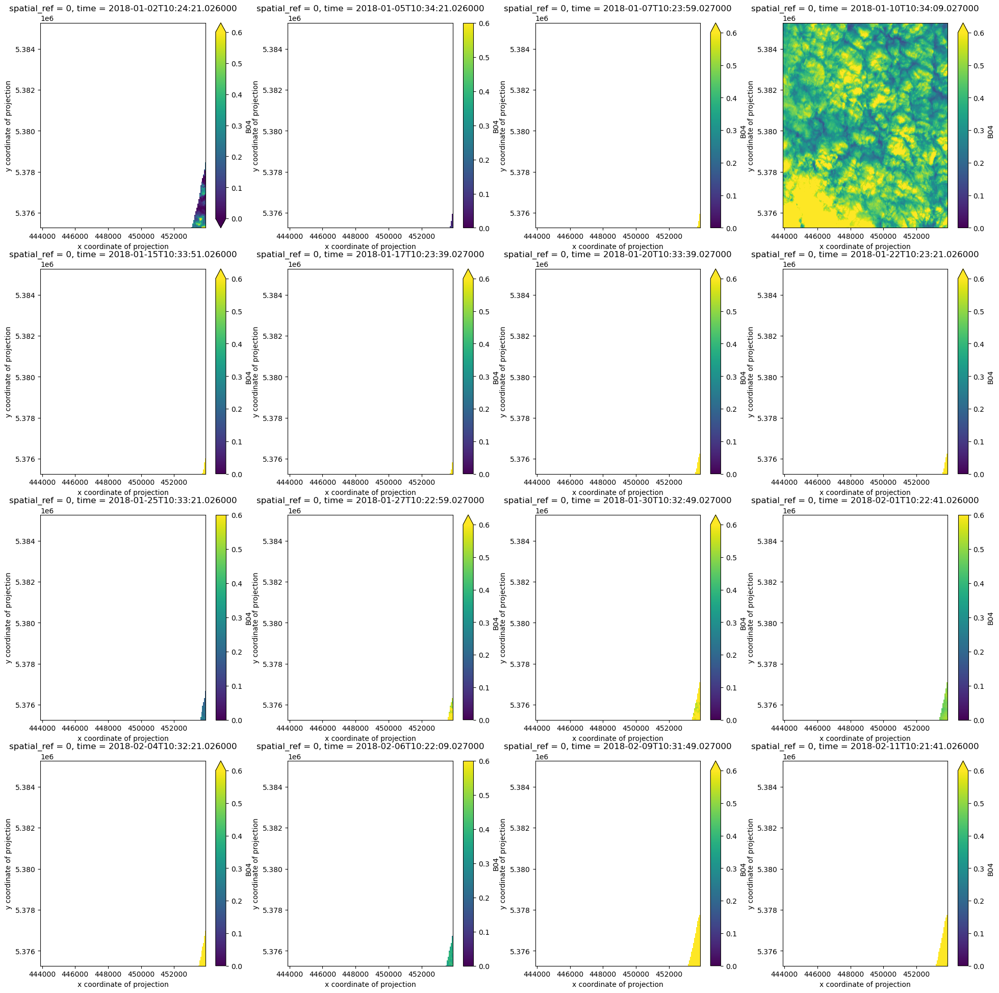

In [16]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

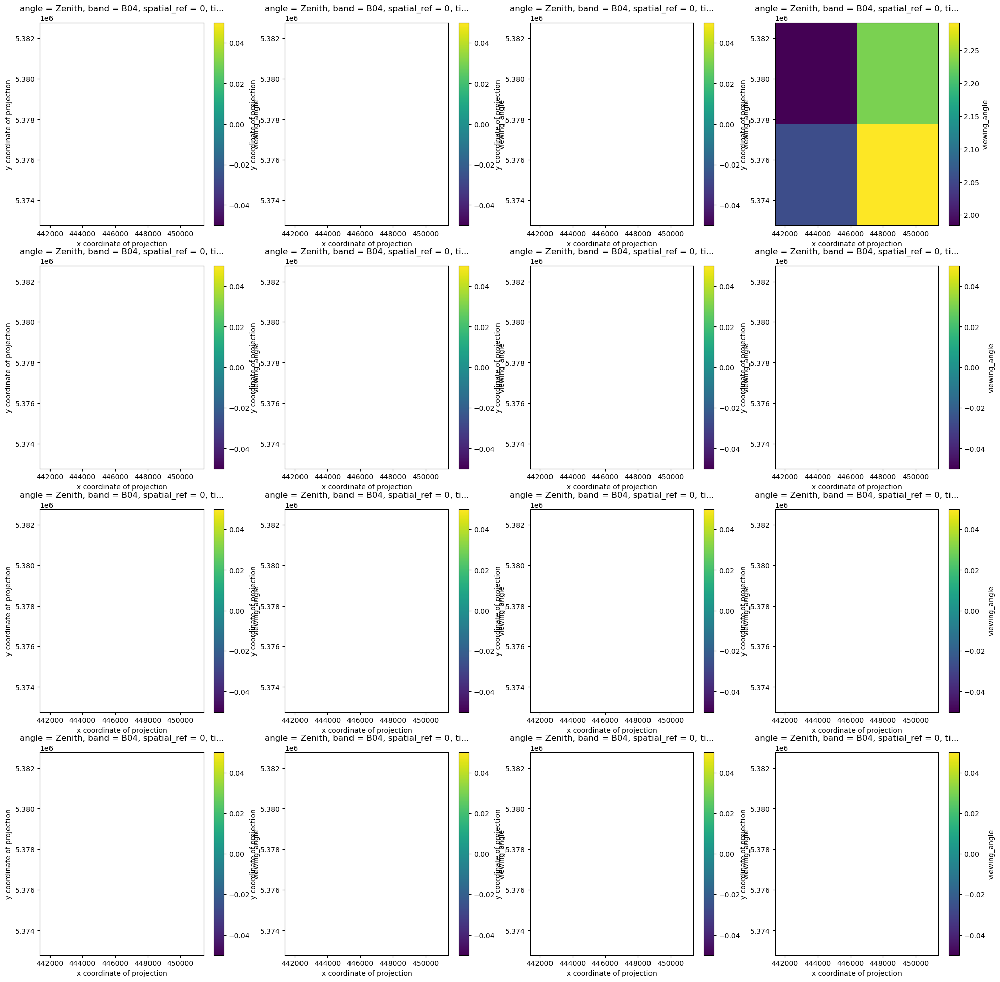

In [17]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

In [18]:
ds = s3_store.open_data("cubes/temp/science/0.1.0/064_2022.zarr")
ds

<xarray.Dataset> Size: 8GB
Dimensions:        (time: 143, y: 1000, x: 1000, angle: 2, angle_x: 2,
                    angle_y: 2, band: 12)
Coordinates:
  * angle          (angle) <U7 56B 'Zenith' 'Azimuth'
  * angle_x        (angle_x) float64 16B 4.439e+05 4.489e+05
  * angle_y        (angle_y) float64 16B 5.38e+06 5.375e+06
  * band           (band) <U5 240B 'B01' 'B02' 'B03' 'B04' ... 'B09' 'B11' 'B12'
    spatial_ref    int64 8B ...
  * time           (time) datetime64[ns] 1kB 2022-01-01T10:24:31.024000 ... 2...
  * x              (x) float64 8kB 4.439e+05 4.439e+05 ... 4.539e+05 4.539e+05
  * y              (y) float64 8kB 5.385e+06 5.385e+06 ... 5.375e+06 5.375e+06
Data variables: (12/15)
    B01            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B02            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B03            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B04            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B05            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B06            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    ...             ...
    B11            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B12            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    B8A            (time, y, x) float32 572MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    SCL            (time, y, x) float64 1GB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    solar_angle    (time, angle, angle_y, angle_x) float32 5kB dask.array<chunksize=(1, 2, 2, 2), meta=np.ndarray>
    viewing_angle  (time, angle, band, angle_y, angle_x) float32 55kB dask.array<chunksize=(1, 2, 12, 2, 2), meta=np.ndarray>
Attributes: (13)

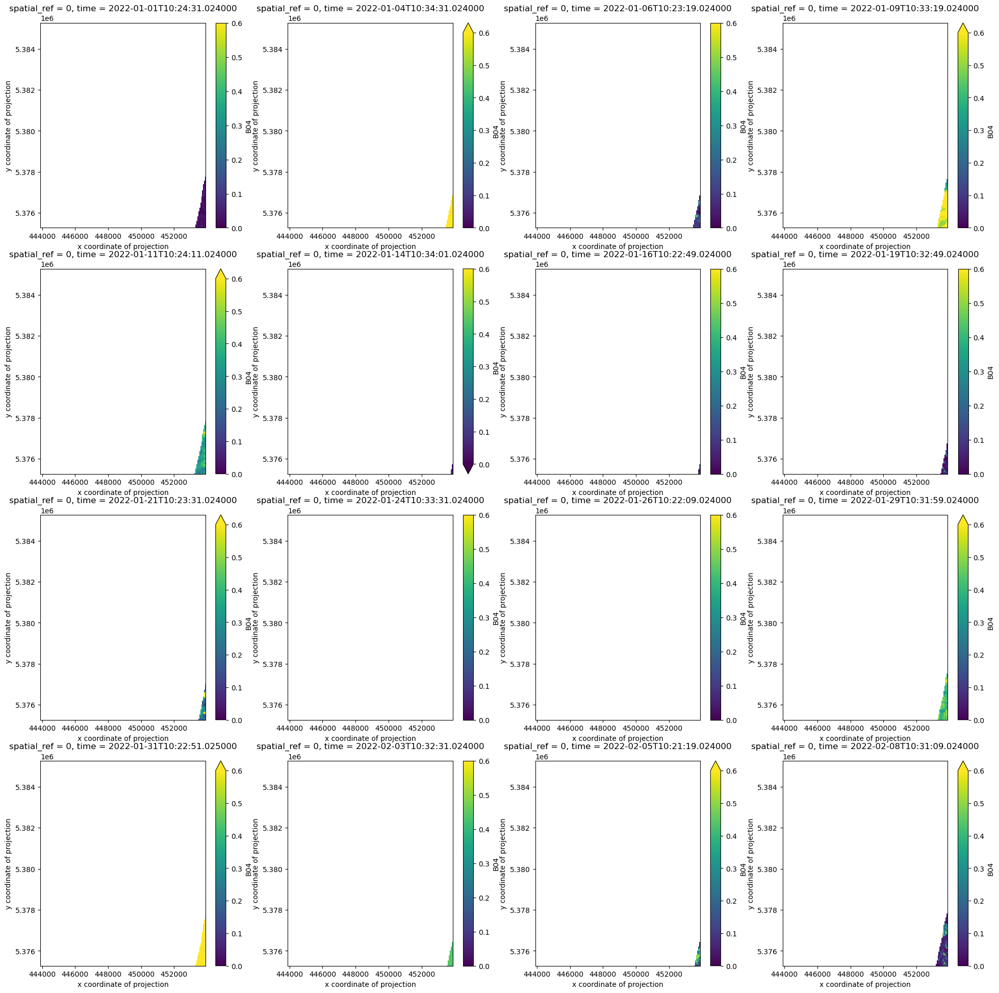

In [19]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.B04.isel(time=i).plot(ax=ax[i], vmin=0., vmax=0.6)

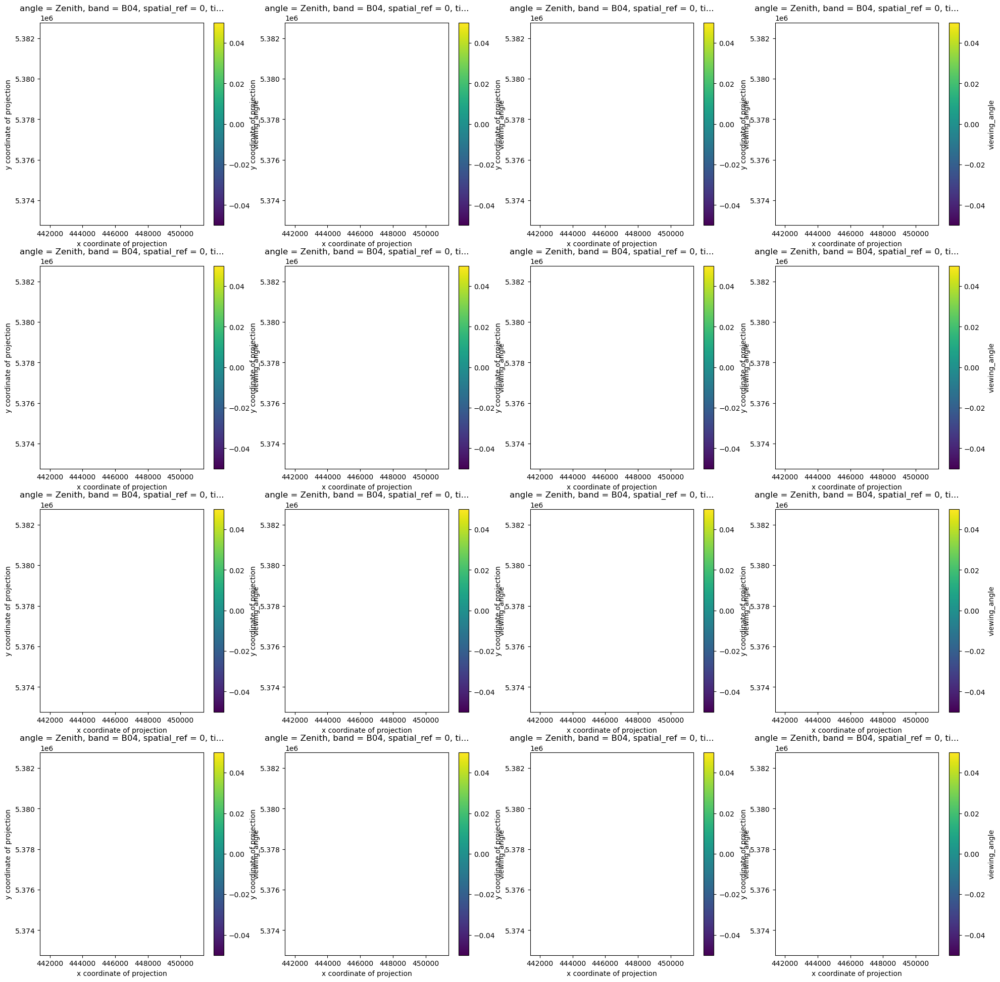

In [20]:
fig, _ax = plt.subplots(4, 4, figsize=(6*4, 6*4))
ax = _ax.flatten()
for i in range(16):
    ds.viewing_angle.isel(time=i, band=3, angle=0).plot(ax=ax[i])

In [22]:
credentials = {
    "key": "O0M0CUQIDQO9TDZ4D8NR",
    "secret": "qPUyXs9G6j8on6MY5KPhQNHuA5uZTqxEscrbBCGx",
}

stac_store = new_data_store("stac-cdse", stack_mode=False, **credentials)
data_id = "collections/sentinel-2-l2a/items/S2A_MSIL2A_20220114T103401_N0510_R108_T32UMU_20240429T232315"
ds = stac_store.open_data(
    data_id,
    asset_names=["B04", "B03", "B02", "SCL"],
    apply_scaling=True
)
ds

<xarray.Dataset> Size: 2GB
Dimensions:      (x: 10980, y: 10980)
Coordinates:
  * x            (x) float64 88kB 4e+05 4e+05 4e+05 ... 5.097e+05 5.098e+05
  * y            (y) float64 88kB 5.4e+06 5.4e+06 5.4e+06 ... 5.29e+06 5.29e+06
    spatial_ref  int64 8B 0
Data variables:
    B04          (y, x) float32 482MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    B03          (y, x) float32 482MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    B02          (y, x) float32 482MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
    SCL          (y, x) uint8 121MB dask.array<chunksize=(1024, 1024), meta=np.ndarray>
Attributes: (2)

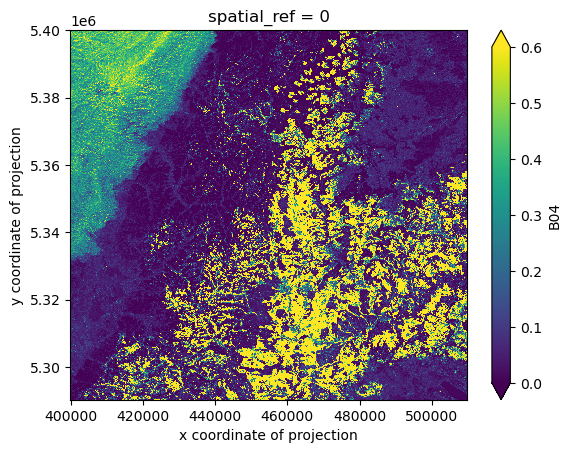

In [25]:
ds.B04[::10, ::10].plot(vmin=0., vmax=0.6)